In [1]:
import numpy as np
import pandas as pd
import csv
import matplotlib.pyplot as plt
import os
from statistics import mean
from statistics import median

In [2]:
#Main Function to run analysis
def runAnalysis(timePath, lifetimePath, SSPath, trim, minLength):
    time = list(pd.read_csv(timePath, header = None)[0])
    lifetime = list(pd.read_csv(lifetimePath, header = None)[0])
    SS = list(pd.read_csv(SSPath, header = None)[0])
    states = {'state1': [1 if i == 1 else 0 for i in SS], 'state2':[1 if i == 2 else 0 for i in SS], 
              'state3': [1 if i == 3 else 0 for i in SS], 'state4':[1 if i == 4 else 0 for i in SS]}
    stateColors = {'state1': 'green', 'state2':'blue', 
                   'state3': 'red', 'state4':'yellow'}
    print('legend: ')
    print(stateColors)
    print('Raw Data')
    plotData(time, states, lifetime, stateColors, True)
    states_analyzed, stateWindows, timeWindows = stateAnalysis(lifetime, states, time, trim, minLength)
    print('Trimmed Data')
    plotData(time, stateWindows, lifetime, stateColors, False)
    
    
    
    states_analyzed_Formatted = {key:pd.Series(value) for key, value in states_analyzed.items()}
    stateWindows_Formatted = {key:pd.Series(value) for key, value in stateWindows.items()}
    timeWindows_Formatted =  {key:pd.Series(value) for key, value in timeWindows.items() }
    
    nestedDict = {k: {'Lifetime Analysis': states_analyzed_Formatted[k], 'Index': stateWindows_Formatted[k], 'Time': timeWindows_Formatted[k]} for k in timeWindows_Formatted.keys()}
    reformed_dict = {}
    for outerKey, innerDict in nestedDict.items():
        for innerKey, values in innerDict.items():
            reformed_dict[(outerKey,
                           innerKey)] = values
    pd.options.display.max_seq_items = 2000        
    results_df = pd.DataFrame(reformed_dict)

    return results_df

    
#Takes in data, omits epochs too short, trims transition periods, analyzes epochs after trimming. 
def stateAnalysis(lifetime, stateData, time, trim, minLength):
    states_analyzed = {}
    stateWindows = {}
    timeWindows = {}
    for key in stateData:
        analyzedWindows = []
        changes = stateChanges(stateData[key])
        

        #omit epochs too short, analyze windows long enough
        i = 0
        while i < len(changes):
            if time[changes[i][1]]-time[changes[i][0]]<minLength:
                changes.remove(changes[i]) #removing epochs too short
            else:
                #trimming ends of epochs
                changes[i][0] = find_nearest(time, time[changes[i][0]]+trim) 
                changes[i][1] = find_nearest(time, time[changes[i][1]]-trim) 
                #analyzedWindows.append(max_surroundMean(lifetime[changes[i][0]:changes[i][1]], 1))
                if len(lifetime[changes[i][0]:changes[i][1]])>1:
                    analyzedWindows.append(median(lifetime[changes[i][0]:changes[i][1]]))
                i+=1
        states_analyzed[key] = analyzedWindows
        stateWindows[key] = changes
        np.save((path + 'results/' + key + 'test.npy'),changes)
        timeWindows[key] = [[time[i[0]],time[i[1]]] for i in changes]
    return states_analyzed, stateWindows, timeWindows
   
#Takes in a list, finds average of max value and n surrounding data points
def max_surroundMean(data, n):
    maxIDX = data.index(max(data))    
    if maxIDX == 0:
        maxIDX = n
    elif maxIDX == len(data)-1:
        maxIDX = maxIDX-n
    return mean(data[maxIDX-n:maxIDX+n+1])
        
#returns index of closest corresponding value in the array 
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx
        
#Returns list of pairs (index) [[start, stop], [start, stop]] for all "true" periods
def stateChanges(data):
    currState = data[0]
    if currState:
        temp = [0]
    changes = []
    for i in range(len(data)):
        if data[i] != currState:
            currState = data[i]
            if currState:
                temp = [i]
            else:
                temp.append(i-1)
                changes.append(temp)
        #if you reach the end of the time series
        elif data[i] and i == (len(data)-1):
                temp.append(i)
                changes.append(temp)
        else:
            pass
    
    return changes
    
def plotData(time, states, lifetime, stateColors, rawStates):
    fig, ax1 = plt.subplots(figsize=(200, 10))
    ax1.plot(time, lifetime)
    ax1.set_xlabel('time (s)')
    ax1.set_ylabel('Lifetime (ns)')
    for key in states:
        if rawStates:
            changes = stateChanges(states[key])
            for i in changes:
                ax1.axvspan(time[i[0]], time[i[1]], color=stateColors[key], alpha=0.5)
        else:
            for i in states[key]:
                ax1.axvspan(time[i[0]], time[i[1]], color=stateColors[key], alpha=0.5)
            
    plt.show()
    


In [3]:
    #path = '20220214_1610_SW_001_analysis_csv_20220426/'
    #path = '20220219_1610_SW_002_analysis_csv_20220426/'
    #path = '20220301_1612_SW_003_analysis_csv_20220426/'
    #path = '20220302_1611_SW_003_analysis_csv_20220426/'
    #path = '20220304_1630_SW_002_analysis_csv_20220426/'
    #path = '20220312_1629_SW_002_analysis_csv_20220426/'
    #path = '20220313_1626_SW_002_analysis_csv_20220426/'
    #path = '20220314_1610_SW_003_analysis_csv_20220426/'
    #path = '20220315_1612_SW_004_analysis_csv_20220426/'
    #path = '20220316_1611_SW_004_analysis_csv_20220426/'
    #path = '20220317_1627_SW_002_analysis_csv_20220426/'
    
    #path = '20220318_1626_SW_003_analysis_csv_20220426/'
    #path = '20220319_1630_SW_003_analysis_csv_20220426/'
    #path = '20220322_1627_SW_003_analysis_csv_20220426/'
    #path = '20220323_1629_SW_003_analysis_csv_20220426/'
    #path = '20220324_1612_SW_005_analysis_csv_20220426/'
    #path = '20220325_1611_SW_005_analysis_csv_20220426/'
    #path = '20220328_1610_SW_005_analysis_csv_20220426/'
    #path = '20220329_1626_SW_004_analysis_csv_20220426/'
    #path = '20220330_1630_SW_004_analysis_csv_20220426/'
    #path = '20220331_1629_SW_004_analysis_csv_20220426/'
    #path = '20220402_1627_SW_004_analysis_csv_20220426/'
    path = '1630/20220330_1630_SW_004_analysis_csv_20230115/'
    
    
    
    
    os.mkdir(path + 'results')

In [4]:
#Parameters
timePath = path + 'time.csv'
lifetimePath = path + 'lft_emp.csv'
statesPath = path + 'states.csv'


trim = 12               #how much to trim from beginning/end of epochs
minLength = 16+(2*trim) #minimum length of epochs to include 
                        #(length before trimming, so if you want 10 secopnds minimum then use 10+(2*trim) as the value)

#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time
    


legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


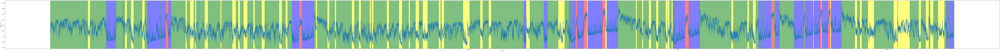

Trimmed Data


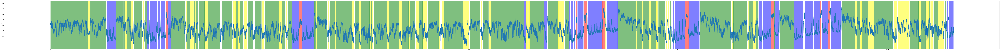

In [5]:
#Cell to run Analysis
results = runAnalysis(timePath, lifetimePath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_emp_epoch_analysis.csv'),index=False)

In [6]:
results

state1                                                state2  \
   Lifetime Analysis           Index                Time Lifetime Analysis   
0            4.22720      [12, 1750]    [13.019, 1788.3]            4.1683   
1            4.22240    [1871, 2596]    [1913.8, 2667.8]            4.1574   
2            4.24820    [3059, 3361]    [3149.7, 3464.3]            4.1642   
3            4.22835    [3391, 3455]    [3499.2, 3564.5]            4.1735   
4            4.23770    [3559, 3734]    [3670.6, 3849.3]            4.1770   
..               ...             ...                 ...               ...   
58           4.22510  [39863, 40262]  [41084.0, 41495.0]               NaN   
59           4.22530  [40386, 40585]  [41624.0, 41831.0]               NaN   
60           4.24340  [40744, 40790]  [41996.0, 42044.0]               NaN   
61           4.21270  [40951, 41146]  [42212.0, 42414.0]               NaN   
62           4.23290  [41460, 41527]  [42741.0, 42811.0]               NaN   

                                              state3                  \
           Index              Time Lifetime Analysis           Index   
0   [2621, 3034]  [2693.8, 3123.7]           4.26260    [5375, 5462]   
1   [4503, 4592]  [4634.1, 4724.9]           4.23770  [11555, 11664]   
2   [4633, 4957]  [4766.7, 5097.3]           4.24140  [24366, 24416]   
3   [5005, 5094]  [5146.3, 5237.0]           4.26595  [24742, 24870]   
4   [5139, 5350]  [5283.1, 5500.6]           4.28120  [25611, 25728]   
..           ...               ...               ...             ...   
58           NaN               NaN               NaN             NaN   
59           NaN               NaN               NaN             NaN   
60           NaN               NaN               NaN             NaN   
61           NaN               NaN               NaN             NaN   
62           NaN               NaN               NaN             NaN   

                                  state4                                  
                  Time Lifetime Analysis         Index              Time  
0     [5526.6, 5617.1]           4.19250  [1775, 1846]  [1814.1, 1887.8]  
1   [11903.0, 12014.0]           4.21235  [3480, 3534]  [3590.0, 3645.1]  
2   [25121.0, 25172.0]           4.16555  [3759, 3851]  [3874.8, 3968.6]  
3   [25505.0, 25636.0]           4.19180  [4284, 4365]  [4410.4, 4493.0]  
4   [26392.0, 26511.0]           4.19020  [6289, 6323]  [6477.4, 6512.8]  
..                 ...               ...           ...               ...  
58                 NaN               NaN           NaN               NaN  
59                 NaN               NaN           NaN               NaN  
60                 NaN               NaN           NaN               NaN  
61                 NaN               NaN           NaN               NaN  
62                 NaN               NaN           NaN               NaN  

[63 rows x 12 columns]

In [7]:
#Parameters
timePath = path + 'time.csv'
lifetimeDCPath = path + 'lft_emp_DC.csv'
statesPath = path + 'states.csv'


#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


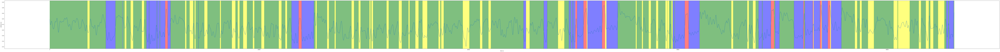

Trimmed Data


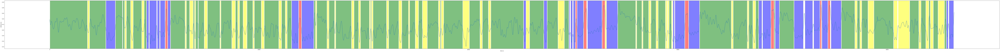

In [8]:
#Cell to run Analysis
results = runAnalysis(timePath, lifetimeDCPath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_emp_DC_epoch_analysis.csv'),index=False)

In [9]:
#Parameters
timePath = path + 'time.csv'
lifetimeACPath = path + 'lft_emp_AC.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


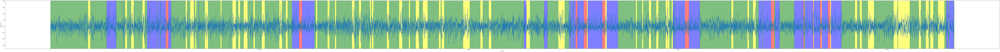

Trimmed Data


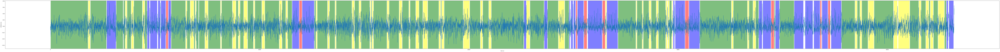

In [10]:
#Cell to run Analysis
results = runAnalysis(timePath, lifetimeACPath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_emp_AC_epoch_analysis.csv'),index=False)

In [11]:
#Parameters
timePath = path + 'time.csv'
intensityPath = path + 'intensity.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


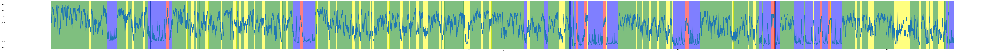

Trimmed Data


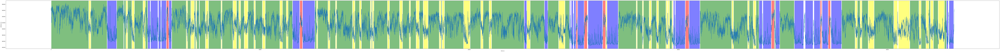

In [12]:
#Cell to run Analysis
results = runAnalysis(timePath, intensityPath, statesPath, trim, minLength)
results.to_csv((path + 'results/intensity_epoch_analysis.csv'),index=False)

In [13]:
#Parameters
timePath = path + 'time.csv'
intensityDCPath = path + 'intensity_DC.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


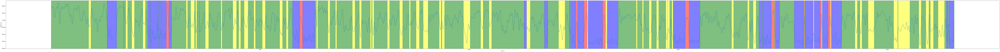

Trimmed Data


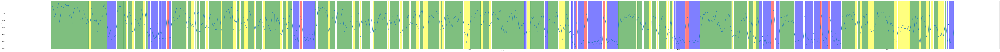

In [14]:
#Cell to run Analysis
results = runAnalysis(timePath, intensityDCPath, statesPath, trim, minLength)
results.to_csv((path + 'results/intensity_DC_epoch_analysis.csv'),index=False)

In [15]:
#Parameters
timePath = path + 'time.csv'
intensityACPath = path + 'intensity_AC.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


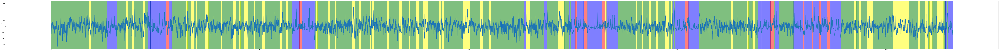

Trimmed Data


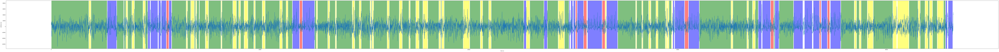

In [16]:
#Cell to run Analysis
results = runAnalysis(timePath, intensityACPath, statesPath, trim, minLength)
results.to_csv((path + 'results/intensity_AC_epoch_analysis.csv'),index=False)

In [17]:
#Parameters
timePath = path + 'time.csv'
LifetimeFitPath = path + 'lft_fit.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


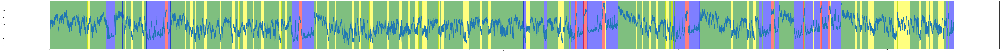

Trimmed Data


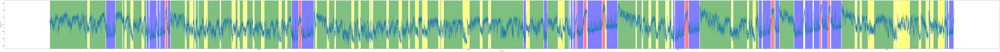

In [18]:
#Cell to run Analysis
results = runAnalysis(timePath, LifetimeFitPath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_fit_epoch_analysis.csv'),index=False)

In [19]:
#Parameters
timePath = path + 'time.csv'
LifetimeFitDCPath = path + 'lft_fit_DC.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


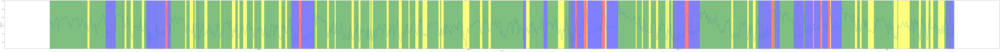

Trimmed Data


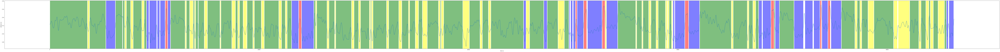

In [20]:
#Cell to run Analysis
results = runAnalysis(timePath, LifetimeFitDCPath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_fit_DC_epoch_analysis.csv'),index=False)

In [21]:
#Parameters
timePath = path + 'time.csv'
LifetimeFitACPath = path + 'lft_fit_AC.csv'
statesPath = path + 'states.csv'



#Data Returned as a df (results)
#Format:
#    State1                                               State 2...
#    calculated lifetime average    index   time window   calculated lifetime average    index   time

legend: 
{'state1': 'green', 'state2': 'blue', 'state3': 'red', 'state4': 'yellow'}
Raw Data


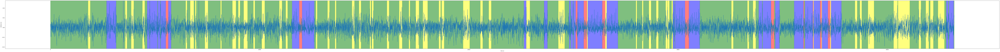

Trimmed Data


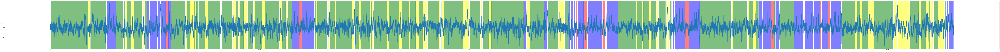

In [22]:
#Cell to run Analysis
results = runAnalysis(timePath, LifetimeFitACPath, statesPath, trim, minLength)
results.to_csv((path + 'results/lft_fit_AC_epoch_analysis.csv'),index=False)